# Shapley值及其应用

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

df = pd.read_csv('process_heart.csv')

# 划分特征和标签
X = df.drop('target',axis=1)
y = df['target']

# 划分训练集和测试集
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

# 构建随机森林模型
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(max_depth=5, n_estimators=100)
model.fit(X_train, y_train)

# 在测试集上预测
y_predict = model.predict(X_test)
y_predict_proba=model.predict_proba(X_test)

In [2]:
import shap
shap.initjs()

/opt/anaconda3/lib/python3.10/site-packages/shap/utils/_clustering.py:35: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def _pt_shuffle_rec(i, indexes, index_mask, partition_tree, M, pos):
/opt/anaconda3/lib/python3.10/site-packages/shap/utils/_clustering.py:54: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def delta_minimization_order(all_masks, max_swap_size=1

# shap值计算

In [3]:
explainer = shap.TreeExplainer(model)
shap_values=explainer.shap_values(X_test)

In [4]:
len(shap_values)

2

In [5]:
shap_values[0].shape
# 不患病结果shap值

(61, 26)

In [6]:
shap_values[1].shape
# 患病结果shap值

(61, 26)

In [7]:
shap_values[0]

array([[ 8.16965101e-03, -3.25724233e-03,  6.33248803e-03, ...,
        -1.01648927e-03,  5.02653732e-02, -5.95059637e-05],
       [ 4.58063354e-02,  1.17554885e-02,  1.90906092e-04, ...,
        -1.01832475e-03,  4.11406788e-02, -4.58341228e-05],
       [ 2.37738965e-02, -1.60321011e-03,  4.47072031e-02, ...,
        -1.73476755e-03,  5.16350538e-02, -3.92238929e-05],
       ...,
       [-1.45421118e-02,  1.75409118e-03,  9.91510136e-03, ...,
        -3.50937594e-04,  4.52143871e-02, -4.06784985e-05],
       [ 1.69565892e-02,  1.24875460e-03, -2.44668777e-02, ...,
         7.75806634e-04,  4.35747969e-02, -3.59840541e-05],
       [ 7.10801519e-03,  1.10734984e-02, -1.95511736e-02, ...,
        -1.97220701e-04,  6.14686572e-02, -1.96987033e-04]])

In [8]:
shap_values[1]

array([[-8.16965101e-03,  3.25724233e-03, -6.33248803e-03, ...,
         1.01648927e-03, -5.02653732e-02,  5.95059637e-05],
       [-4.58063354e-02, -1.17554885e-02, -1.90906092e-04, ...,
         1.01832475e-03, -4.11406788e-02,  4.58341228e-05],
       [-2.37738965e-02,  1.60321011e-03, -4.47072031e-02, ...,
         1.73476755e-03, -5.16350538e-02,  3.92238929e-05],
       ...,
       [ 1.45421118e-02, -1.75409118e-03, -9.91510136e-03, ...,
         3.50937594e-04, -4.52143871e-02,  4.06784985e-05],
       [-1.69565892e-02, -1.24875460e-03,  2.44668777e-02, ...,
        -7.75806634e-04, -4.35747969e-02,  3.59840541e-05],
       [-7.10801519e-03, -1.10734984e-02,  1.95511736e-02, ...,
         1.97220701e-04, -6.14686572e-02,  1.96987033e-04]])

In [9]:
expected_value=explainer.expected_value
# 平均概率

In [10]:
explainer.expected_value[0]+explainer.expected_value[1]
# 概率之和

1.0000000000000002

In [11]:
shap_values[1].sum(axis=1).shape

(61,)

In [12]:
y_pred_proba_shap=shap_values[1].sum(axis=1)+explainer.expected_value[1]

In [13]:
y_pred_proba_shap.shape

(61,)

In [14]:
y_pred_proba_shap

array([0.13280836, 0.31806324, 0.28744185, 0.75844994, 0.23105665,
       0.79774494, 0.59258219, 0.68906135, 0.90390933, 0.08200759,
       0.941087  , 0.14351376, 0.68391845, 0.87070493, 0.18221195,
       0.84483397, 0.11235393, 0.01075081, 0.62539583, 0.28086077,
       0.1235192 , 0.79959807, 0.64969887, 0.85652842, 0.19797169,
       0.21418861, 0.03428533, 0.07014427, 0.82445196, 0.02288374,
       0.88143619, 0.26067245, 0.14818018, 0.18022558, 0.01197051,
       0.12213446, 0.77727714, 0.46645094, 0.85018292, 0.23114589,
       0.05606033, 0.24019231, 0.86066111, 0.5800703 , 0.91562429,
       0.46055984, 0.53561449, 0.83126506, 0.76053872, 0.4571644 ,
       0.51113596, 0.86840244, 0.08345097, 0.1308485 , 0.95194715,
       0.74928646, 0.78362738, 0.75384159, 0.01807885, 0.03934191,
       0.63449264])

In [15]:
model.predict_proba(X_test)

array([[0.86719164, 0.13280836],
       [0.68193676, 0.31806324],
       [0.71255815, 0.28744185],
       [0.24155006, 0.75844994],
       [0.76894335, 0.23105665],
       [0.20225506, 0.79774494],
       [0.40741781, 0.59258219],
       [0.31093865, 0.68906135],
       [0.09609067, 0.90390933],
       [0.91799241, 0.08200759],
       [0.058913  , 0.941087  ],
       [0.85648624, 0.14351376],
       [0.31608155, 0.68391845],
       [0.12929507, 0.87070493],
       [0.81778805, 0.18221195],
       [0.15516603, 0.84483397],
       [0.88764607, 0.11235393],
       [0.98924919, 0.01075081],
       [0.37460417, 0.62539583],
       [0.71913923, 0.28086077],
       [0.8764808 , 0.1235192 ],
       [0.20040193, 0.79959807],
       [0.35030113, 0.64969887],
       [0.14347158, 0.85652842],
       [0.80202831, 0.19797169],
       [0.78581139, 0.21418861],
       [0.96571467, 0.03428533],
       [0.92985573, 0.07014427],
       [0.17554804, 0.82445196],
       [0.97711626, 0.02288374],
       [0.

In [16]:
model.predict_proba(X_test)[:,1]

array([0.13280836, 0.31806324, 0.28744185, 0.75844994, 0.23105665,
       0.79774494, 0.59258219, 0.68906135, 0.90390933, 0.08200759,
       0.941087  , 0.14351376, 0.68391845, 0.87070493, 0.18221195,
       0.84483397, 0.11235393, 0.01075081, 0.62539583, 0.28086077,
       0.1235192 , 0.79959807, 0.64969887, 0.85652842, 0.19797169,
       0.21418861, 0.03428533, 0.07014427, 0.82445196, 0.02288374,
       0.88143619, 0.26067245, 0.14818018, 0.18022558, 0.01197051,
       0.12213446, 0.77727714, 0.46645094, 0.85018292, 0.23114589,
       0.05606033, 0.24019231, 0.86066111, 0.5800703 , 0.91562429,
       0.46055984, 0.53561449, 0.83126506, 0.76053872, 0.4571644 ,
       0.51113596, 0.86840244, 0.08345097, 0.1308485 , 0.95194715,
       0.74928646, 0.78362738, 0.75384159, 0.01807885, 0.03934191,
       0.63449264])

# 特征重要度可视化

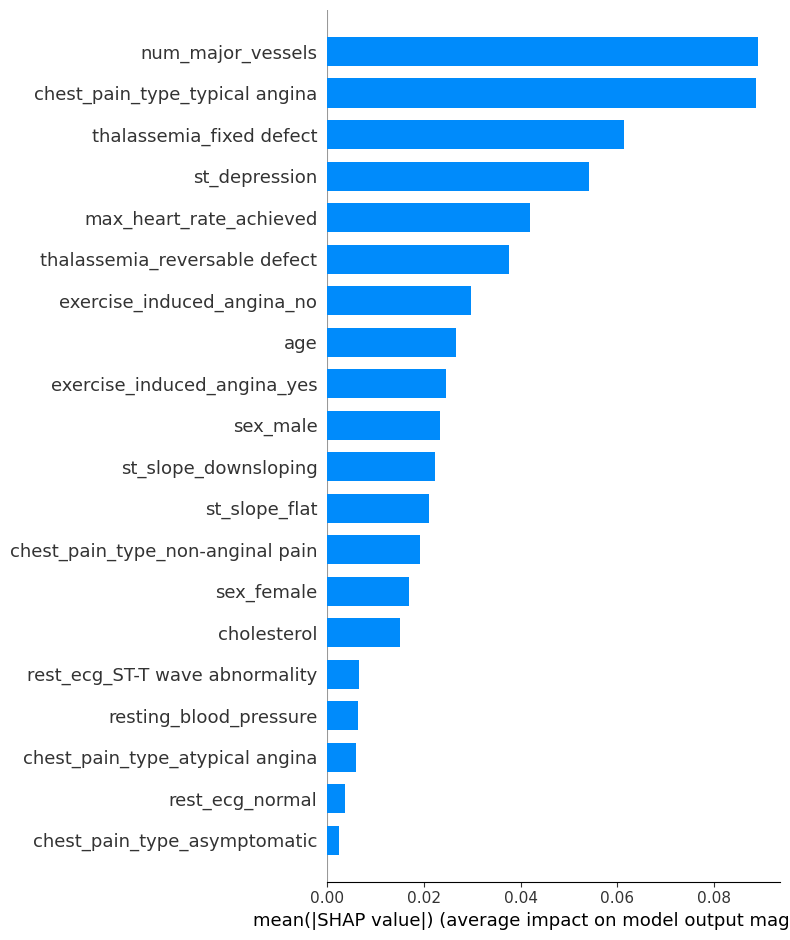

In [17]:
shap.summary_plot(shap_values[1], X_test, plot_type="bar")

# 特征值大小与其shap值大小的关系

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


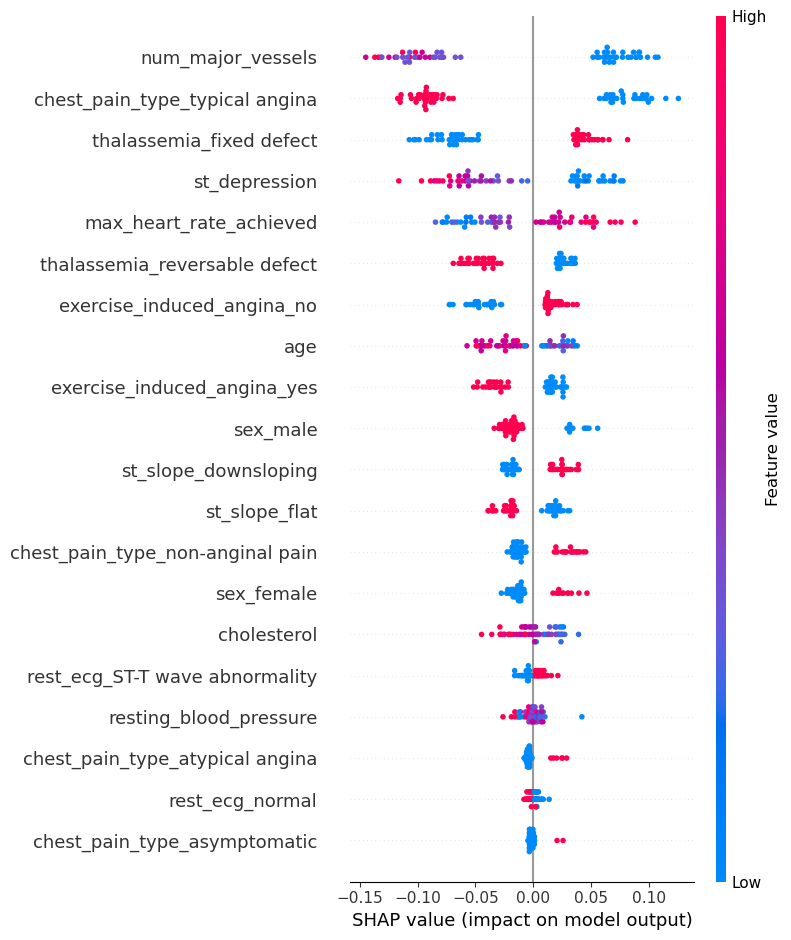

In [18]:
shap.summary_plot(shap_values[1], X_test)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


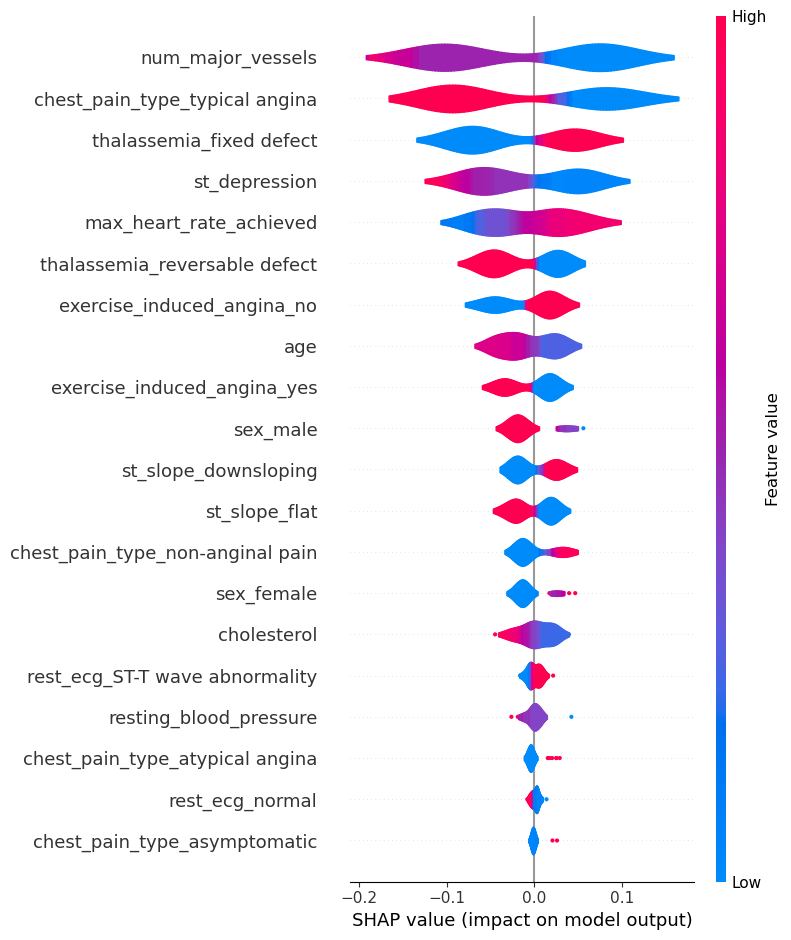

In [19]:
shap.summary_plot(shap_values[1], X_test, plot_type="violin")

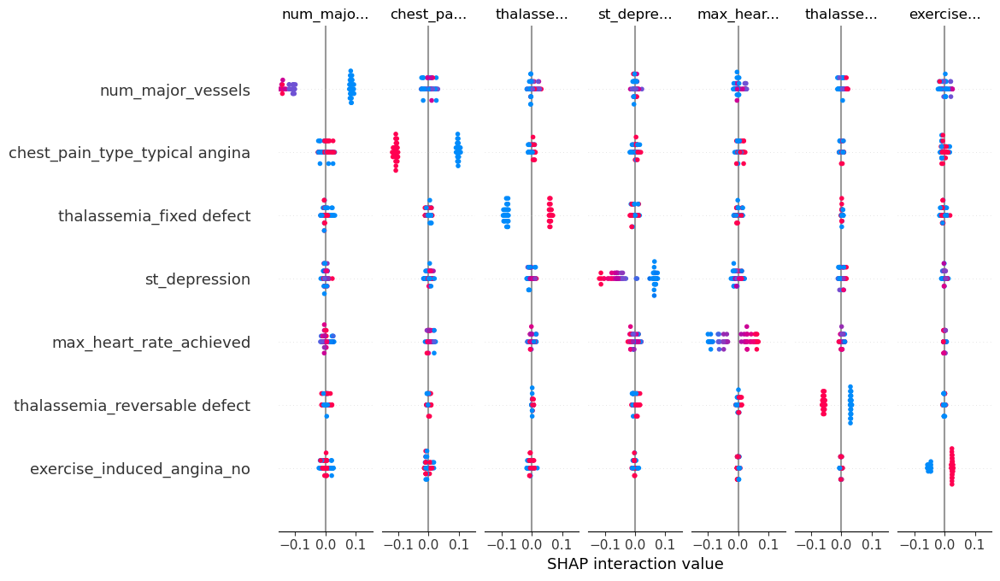

In [20]:
shap_interaction_values=explainer.shap_interaction_values(X_test)
shap.summary_plot(shap_interaction_values[1], X_test)

# 单个样本个特征对预测“患病”结果的影响

In [21]:
X_test.head(10)

,age,resting_blood_pressure,cholesterol,max_heart_rate_achieved,st_depression,num_major_vessels,sex_female,sex_male,chest_pain_type_asymptomatic,chest_pain_type_atypical angina,...,rest_ecg_normal,exercise_induced_angina_no,exercise_induced_angina_yes,st_slope_downsloping,st_slope_flat,st_slope_upsloping,thalassemia_fixed defect,thalassemia_normal,thalassemia_reversable defect,thalassemia_unknown
246,56,134,409,150,1.9,2,1,0,0,0,...,1,0,1,0,1,0,0,0,1,0
183,58,112,230,165,2.5,1,0,1,0,0,...,1,1,0,0,1,0,0,0,1,0
229,64,125,309,131,1.8,0,0,1,0,0,...,0,0,1,0,1,0,0,0,1,0
126,47,112,204,143,0.1,0,0,1,0,0,...,0,1,0,1,0,0,1,0,0,0
184,50,150,243,128,2.6,0,0,1,0,0,...,1,1,0,0,1,0,0,0,1,0
1,37,130,250,187,3.5,0,0,1,0,0,...,0,1,0,0,0,1,1,0,0,0
59,57,128,303,159,0.0,1,1,0,0,0,...,1,1,0,1,0,0,1,0,0,0
194,60,140,185,155,3.0,0,0,1,0,0,...,1,1,0,0,1,0,1,0,0,0
132,42,120,295,162,0.0,0,0,1,0,1,...,0,1,0,1,0,0,1,0,0,0
175,40,110,167,114,2.0,0,0,1,0,0,...,1,0,1,0,1,0,0,0,1,0


In [22]:
idx=12
patient=X.iloc[idx, :]

In [23]:
patient

age                                           49.0
resting_blood_pressure                       130.0
cholesterol                                  266.0
max_heart_rate_achieved                      171.0
st_depression                                  0.6
num_major_vessels                              0.0
sex_female                                     0.0
sex_male                                       1.0
chest_pain_type_asymptomatic                   0.0
chest_pain_type_atypical angina                1.0
chest_pain_type_non-anginal pain               0.0
chest_pain_type_typical angina                 0.0
fasting_blood_sugar_greater than 120mg/ml      0.0
fasting_blood_sugar_lower than 120mg/ml        1.0
rest_ecg_ST-T wave abnormality                 1.0
rest_ecg_left ventricular hypertrophy          0.0
rest_ecg_normal                                0.0
exercise_induced_angina_no                     1.0
exercise_induced_angina_yes                    0.0
st_slope_downsloping           

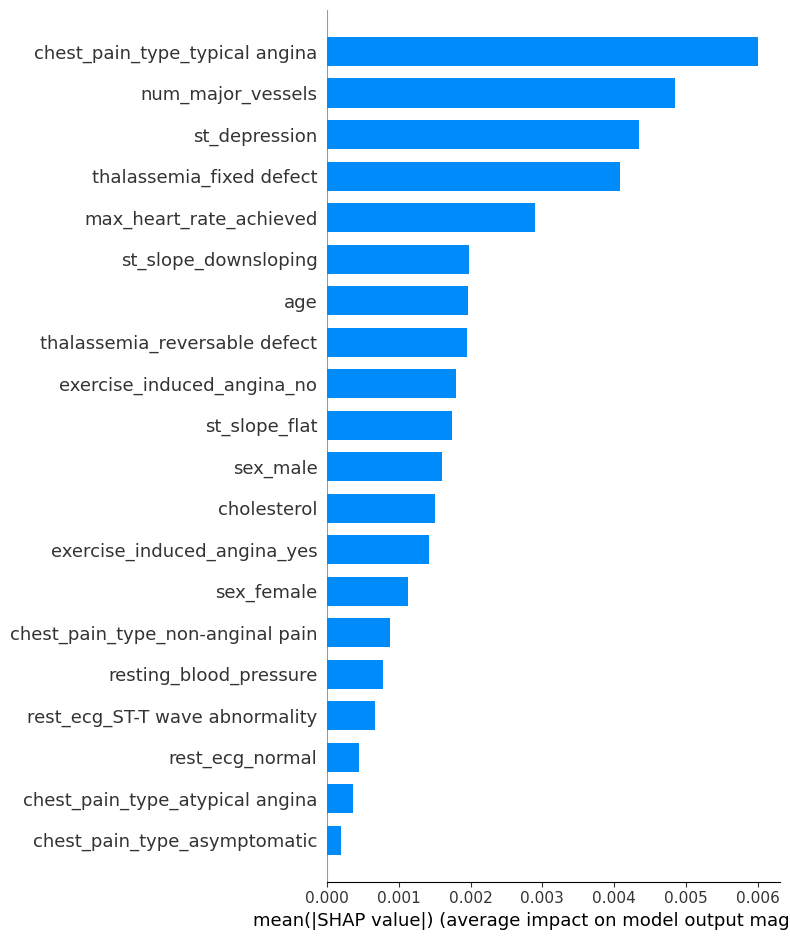

In [24]:
shap.summary_plot(shap_interaction_values[1][3], X_test, plot_type="bar")

In [25]:
shap_values_patient=explainer.shap_values(patient)

In [26]:
shap_values_patient

[array([-3.23409020e-02, -6.02855139e-03,  5.82201999e-03, -4.48531107e-02,
        -3.12919778e-02, -6.66035391e-02,  1.16850749e-02,  1.53826774e-02,
        -8.99332245e-04, -1.57958001e-02,  6.36843196e-03, -6.95047172e-02,
         2.67266205e-05,  9.40219927e-05, -5.78705816e-03, -1.24185045e-04,
        -2.84785059e-03, -1.32216247e-02, -1.28259130e-02, -1.95156560e-02,
        -1.50361658e-02,  2.59653719e-04, -4.41336725e-02, -1.92456494e-03,
        -2.67320935e-02, -2.41359173e-04]),
 array([ 3.23409020e-02,  6.02855139e-03, -5.82201999e-03,  4.48531107e-02,
         3.12919778e-02,  6.66035391e-02, -1.16850749e-02, -1.53826774e-02,
         8.99332245e-04,  1.57958001e-02, -6.36843196e-03,  6.95047172e-02,
        -2.67266205e-05, -9.40219927e-05,  5.78705816e-03,  1.24185045e-04,
         2.84785059e-03,  1.32216247e-02,  1.28259130e-02,  1.95156560e-02,
         1.50361658e-02, -2.59653719e-04,  4.41336725e-02,  1.92456494e-03,
         2.67320935e-02,  2.41359173e-04])]

In [27]:
shap_values_patient[0]

array([-3.23409020e-02, -6.02855139e-03,  5.82201999e-03, -4.48531107e-02,
       -3.12919778e-02, -6.66035391e-02,  1.16850749e-02,  1.53826774e-02,
       -8.99332245e-04, -1.57958001e-02,  6.36843196e-03, -6.95047172e-02,
        2.67266205e-05,  9.40219927e-05, -5.78705816e-03, -1.24185045e-04,
       -2.84785059e-03, -1.32216247e-02, -1.28259130e-02, -1.95156560e-02,
       -1.50361658e-02,  2.59653719e-04, -4.41336725e-02, -1.92456494e-03,
       -2.67320935e-02, -2.41359173e-04])

In [28]:
shap_values_patient[1]

array([ 3.23409020e-02,  6.02855139e-03, -5.82201999e-03,  4.48531107e-02,
        3.12919778e-02,  6.66035391e-02, -1.16850749e-02, -1.53826774e-02,
        8.99332245e-04,  1.57958001e-02, -6.36843196e-03,  6.95047172e-02,
       -2.67266205e-05, -9.40219927e-05,  5.78705816e-03,  1.24185045e-04,
        2.84785059e-03,  1.32216247e-02,  1.28259130e-02,  1.95156560e-02,
        1.50361658e-02, -2.59653719e-04,  4.41336725e-02,  1.92456494e-03,
        2.67320935e-02,  2.41359173e-04])

In [29]:
shap_values_patient[0]+shap_values_patient[1]

array([ 6.93889390e-18,  5.20417043e-18, -7.80625564e-18,  2.77555756e-17,
        6.93889390e-18,  5.55111512e-17,  6.93889390e-18, -1.73472348e-18,
       -1.08420217e-19,  0.00000000e+00,  3.46944695e-18, -1.38777878e-17,
        8.26704157e-19,  8.40256684e-19,  1.73472348e-18,  5.42101086e-20,
       -1.73472348e-18, -3.46944695e-18,  5.20417043e-18, -1.73472348e-17,
        1.04083409e-17,  1.08420217e-19,  0.00000000e+00, -1.08420217e-18,
        1.38777878e-17,  2.43945489e-19])

In [30]:
shap.force_plot(explainer.expected_value[1], shap_values_patient[1], patient)
# 红色：正向贡献
# 蓝色：负向贡献

# Summary Plot
* 将测试集所有样本的force plot旋转九十度并拼接在一起，形成summary plot

In [31]:
# summary plot
number_show=60
shap_values_summary=explainer.shap_values(X_train.iloc[:number_show])
shap.force_plot(explainer.expected_value[1], shap_values_summary[1], X_test.iloc[:number_show])

# Dependence Plot

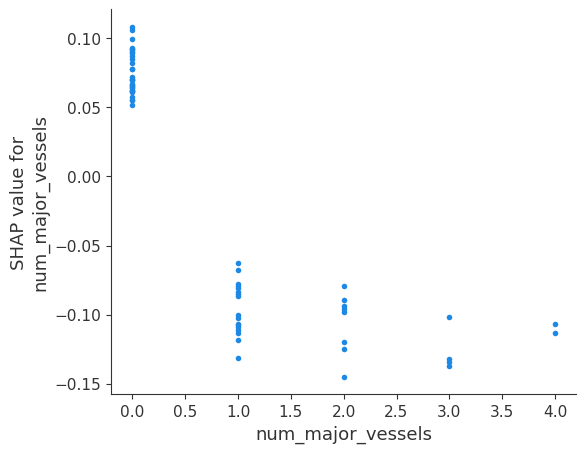

In [32]:
shap.dependence_plot("num_major_vessels", shap_values[1], X_test, interaction_index=None)

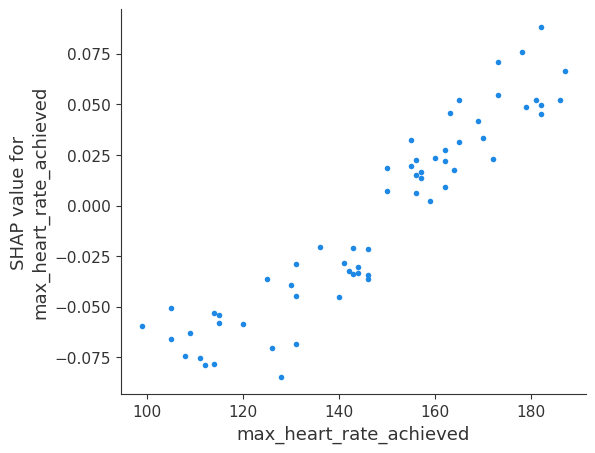

In [33]:
shap.dependence_plot("max_heart_rate_achieved", shap_values[1], X_test, interaction_index=None)

# Partial Dependence Plot
* 展示某特征从小变大时模型预测的结果

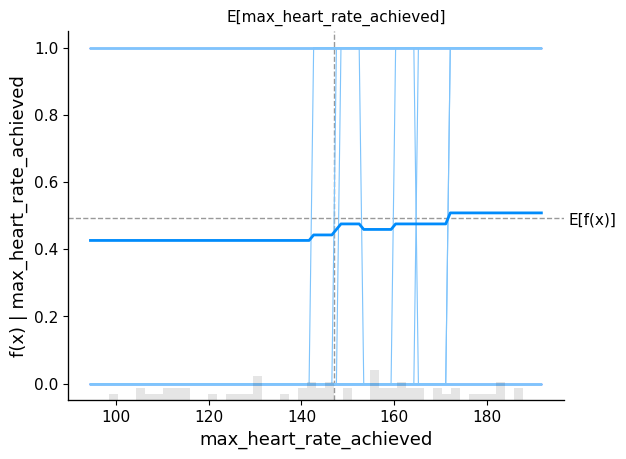

In [34]:
shap.partial_dependence_plot("max_heart_rate_achieved", model.predict, X_test, model_expected_value=True, feature_expected_value=True)

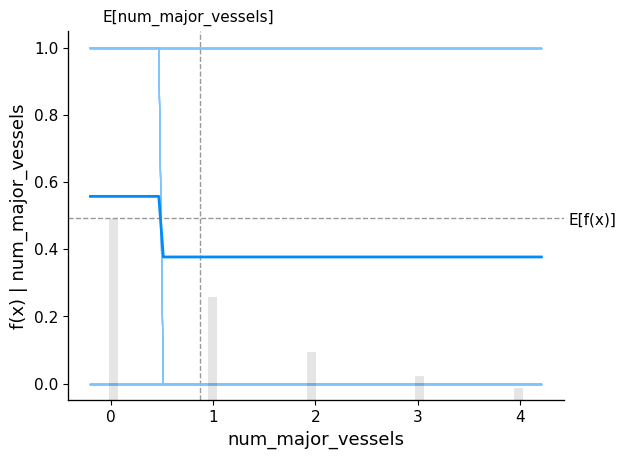

In [35]:
shap.partial_dependence_plot("num_major_vessels", model.predict, X_test, model_expected_value=True, feature_expected_value=True)

# 决策图
* 展示测试集所有数据的决策过程

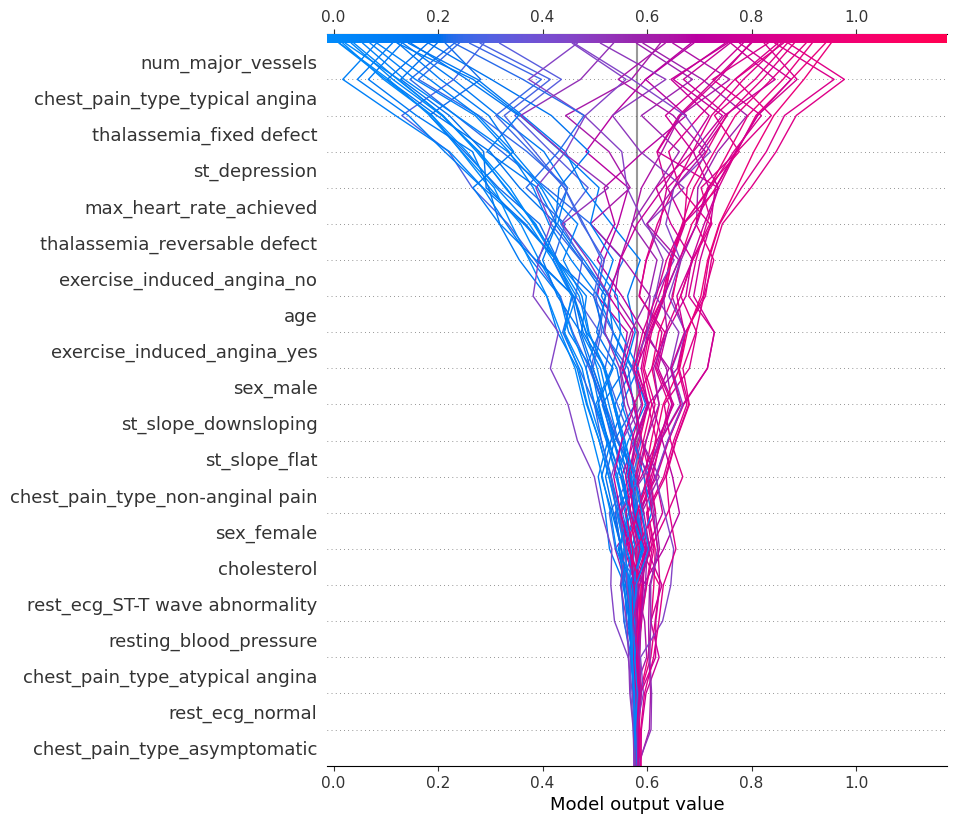

In [36]:
shap.decision_plot(expected_value[1], shap_values[1], X_test)

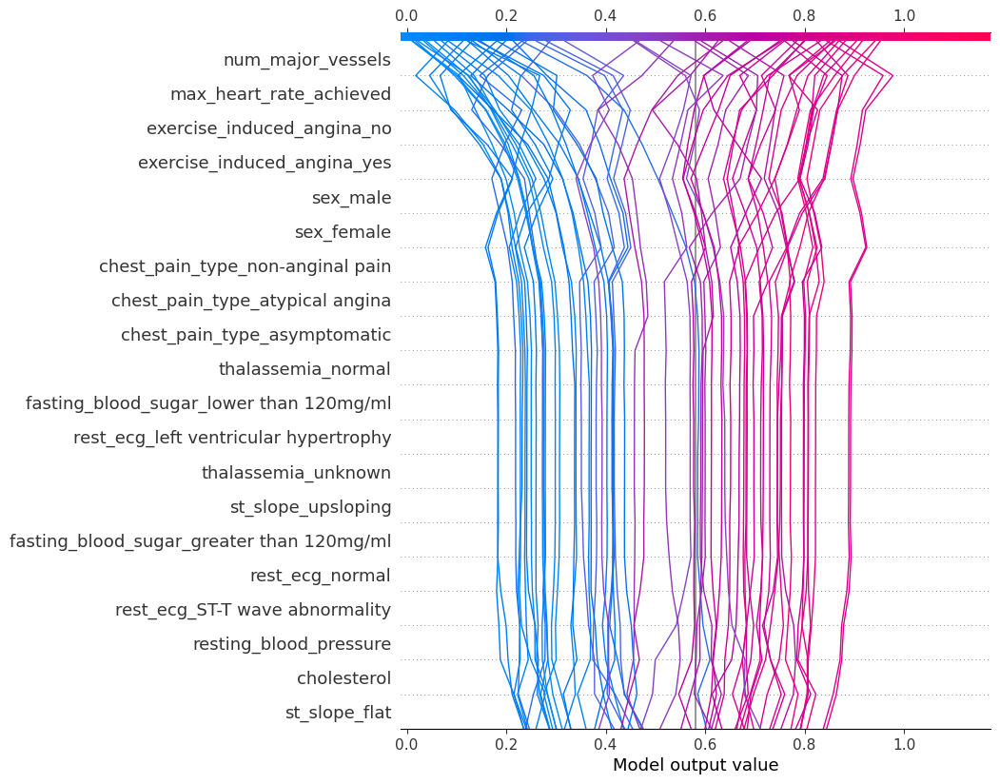

In [37]:
shap.decision_plot(expected_value[1], shap_values[1], X_test, feature_order='hclust')

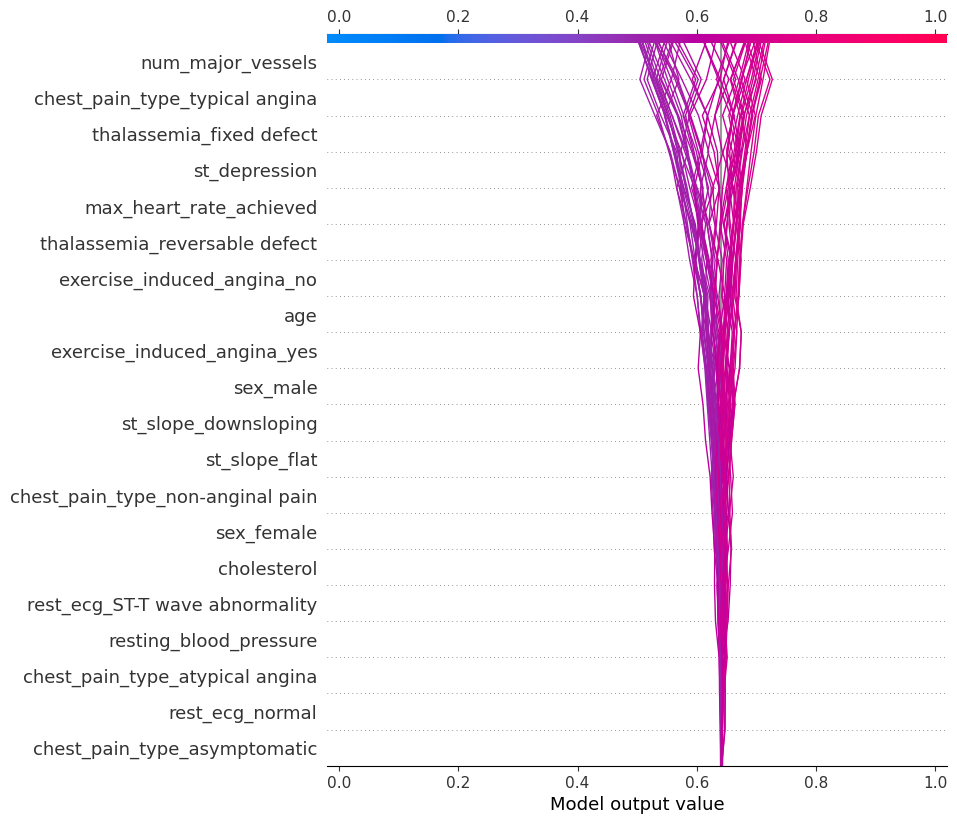

In [38]:
shap.decision_plot(expected_value[1], shap_values[1], X_test, link='logit')

# 单个样本决策图

样本索引号: 27 ，原始数据集X中索引号： 186 


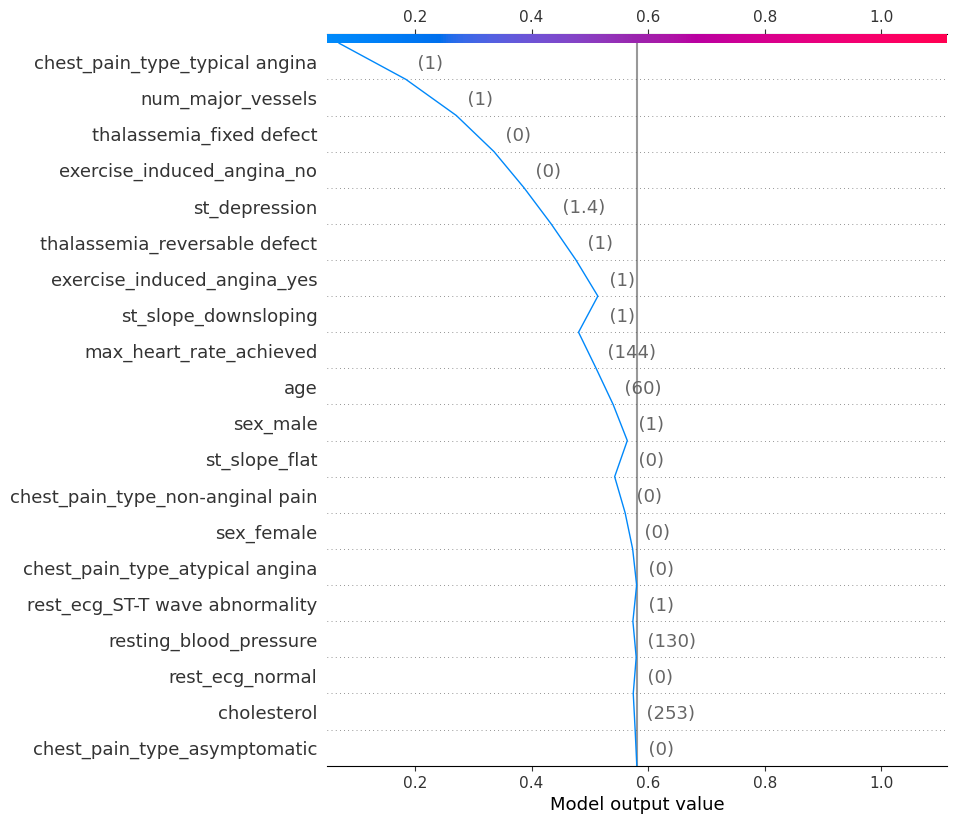

In [39]:
idx = 27
selection = np.zeros((61))
selection[idx] = 1
selection = selection > 0

print('样本索引号: {} ，原始数据集X中索引号： {} '.format(idx,X_test.iloc[idx:idx+1].index[0]))

shap.decision_plot(expected_value[1], shap_values[1][selection], X_test[selection])

# 自定义决策图特征显示顺序

In [40]:
X_test.shape

(61, 26)

In [41]:
feature_idx = [i for i in range(26)]

In [42]:
feature_idx

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25]

样本索引号: 27 ，原始数据集X中索引号： 186 


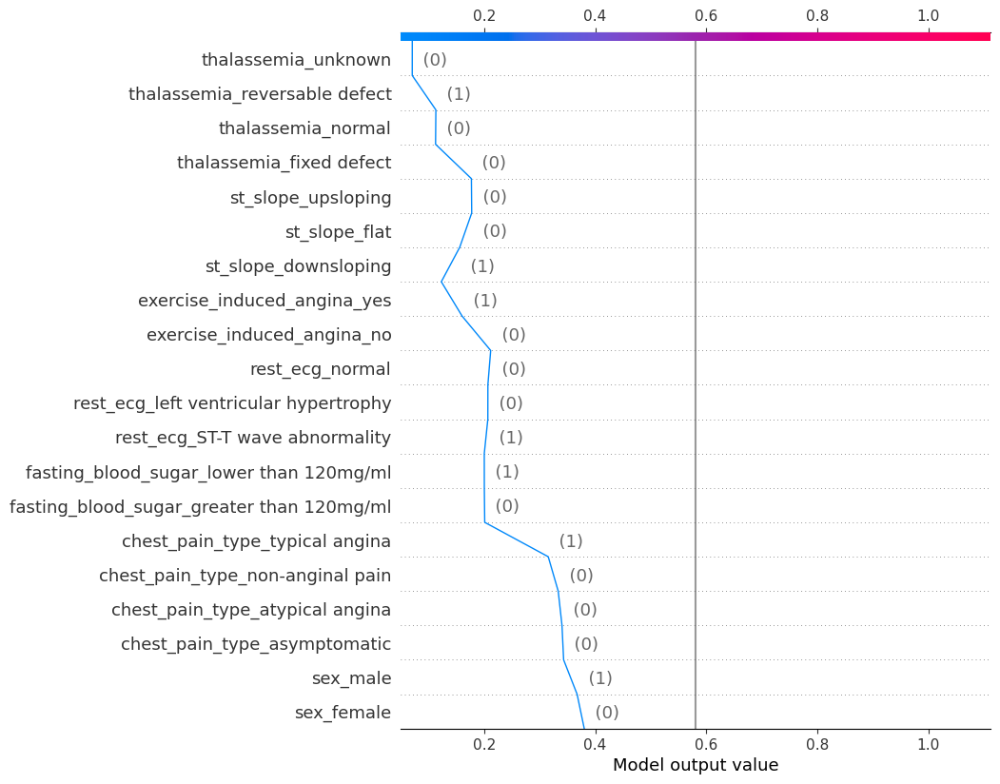

In [43]:
idx = 27
selection = np.zeros((61))
selection[idx] = 1
selection = selection > 0

print('样本索引号: {} ，原始数据集X中索引号： {} '.format(idx,X_test.iloc[idx:idx+1].index[0]))
shap.decision_plot(expected_value[1], shap_values[1][selection], X_test[selection], feature_order=feature_idx)

# 选出测试集中错误的样本

In [44]:
misclassified = y_predict != y_test
misclassified_df = pd.DataFrame({'是否预测错误':misclassified})

In [45]:
misclassified_df

,是否预测错误
246,False
183,False
229,False
126,False
184,False
...,...
277,True
121,False
187,False
301,False


In [46]:
misclassified_df = misclassified_df[misclassified_df['是否预测错误'] == True]

In [47]:
misclassified_df

,是否预测错误
194,True
296,True
139,True
287,True
52,True
138,True
188,True
259,True
106,True
173,True


In [48]:
idx = 173

patient = X.iloc[idx,:]
patient_df = X.loc[idx:idx]
model_predict_proba = model.predict_proba(patient_df)[0][1]
print('{}号病人的真实标签是 {} ，模型预测为 {:.2f} '.format(idx, bool(y_test[idx]), model_predict_proba))

shap_values_patient = explainer.shap_values(patient)
shap.force_plot(explainer.expected_value[1], shap_values_patient[1], patient)

173号病人的真实标签是 False ，模型预测为 0.51 


In [49]:
idx = 52

patient = X.iloc[idx,:]
patient_df = X.loc[idx:idx]
model_predict_proba = model.predict_proba(patient_df)[0][1]
print('{}号病人的真实标签是 {} ，模型预测为 {:.2f} '.format(idx, bool(y_test[idx]), model_predict_proba))

shap_values_patient = explainer.shap_values(patient)
shap.force_plot(explainer.expected_value[1], shap_values_patient[1], patient)

52号病人的真实标签是 True ，模型预测为 0.26 


# 显示预测错误的样本
* 红线：假正例（没患病的病人被模型错误分类为患病）
* 蓝线；假反例（患病病人被模型错误分类为不患病）

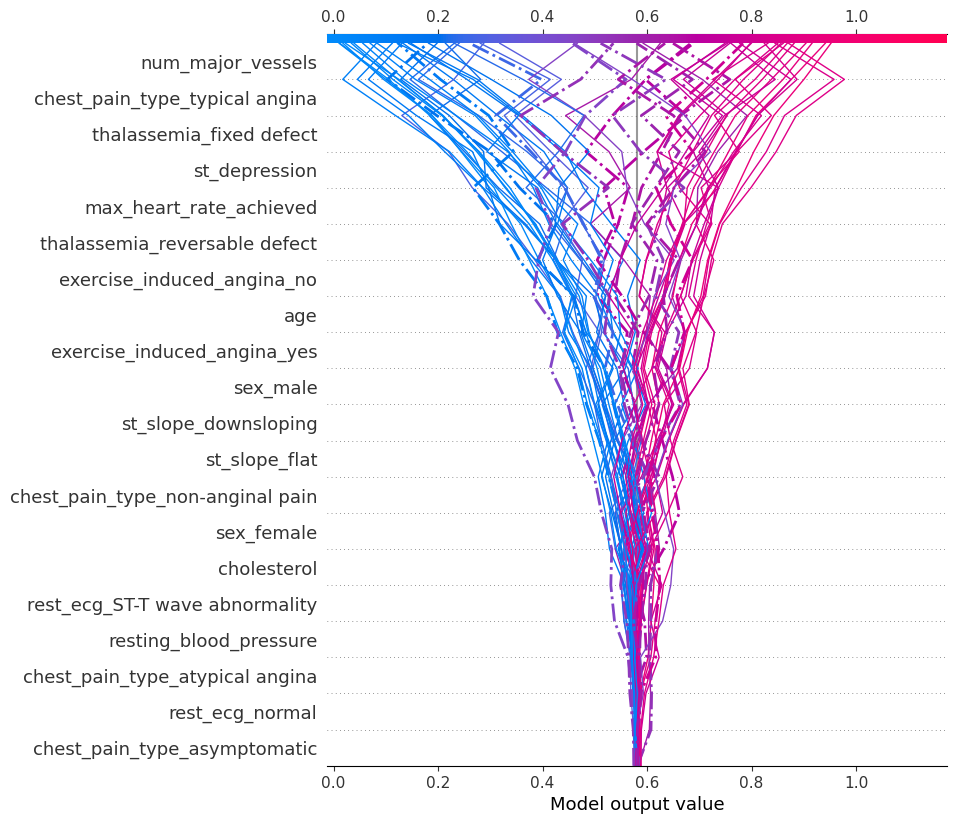

In [50]:
shap.decision_plot(expected_value[1], shap_values[1], X_test, highlight=misclassified)

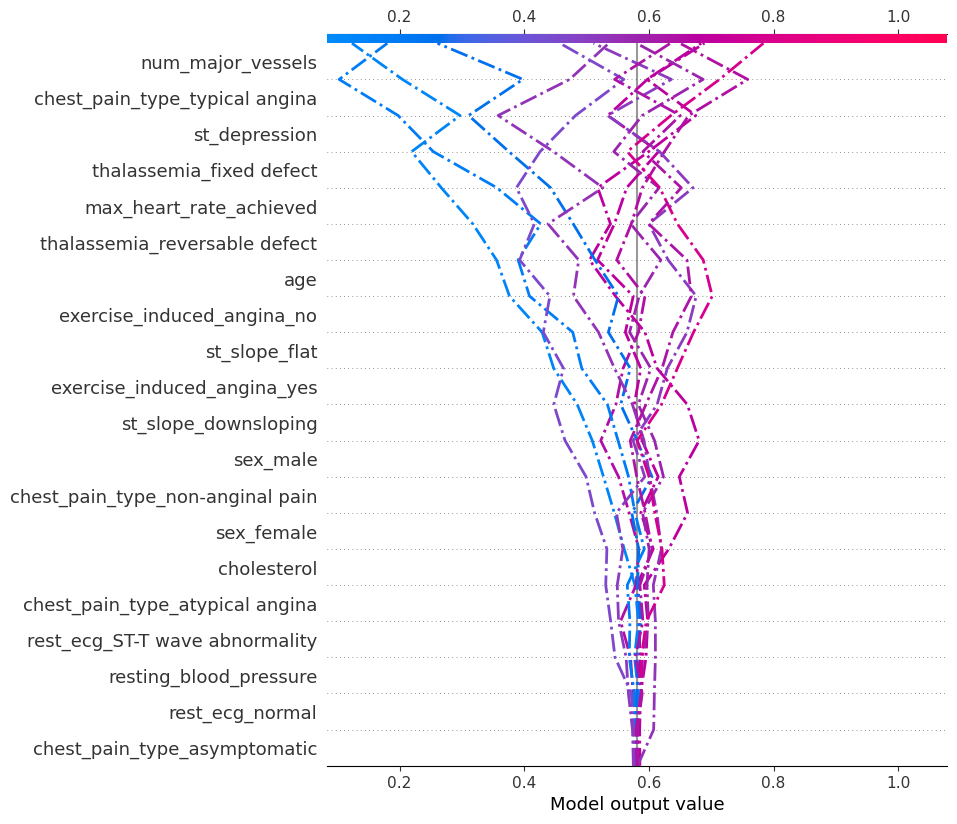

In [51]:
shap.decision_plot(expected_value[1], shap_values[1][misclassified], X_test[misclassified], highlight=range(len(misclassified_df)))

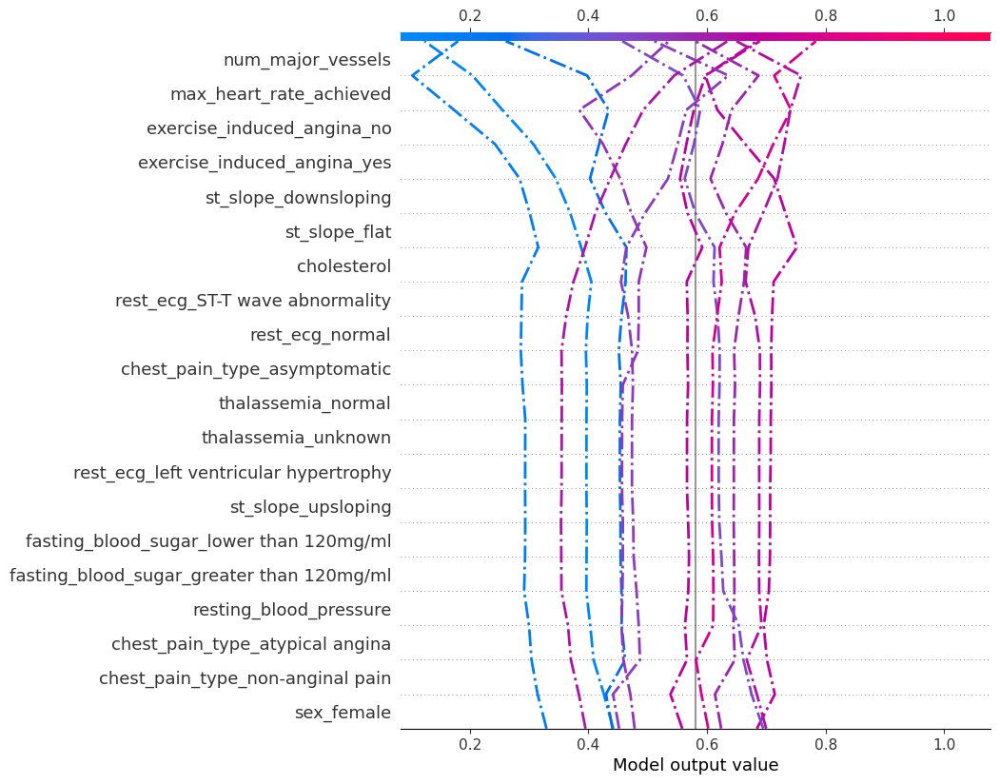

In [52]:
shap.decision_plot(expected_value[1], shap_values[1][misclassified], X_test[misclassified], highlight=range(len(misclassified_df)),feature_order='hclust')

# 探究两两交互特征对预测结果的影响

In [53]:
shap_interaction_values = explainer.shap_interaction_values(X_test)

In [54]:
shap_interaction_values[1].shape

(61, 26, 26)

In [55]:
shap_interaction_values[0].shape

(61, 26, 26)

In [56]:
shap_interaction_values[1].shape

(61, 26, 26)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


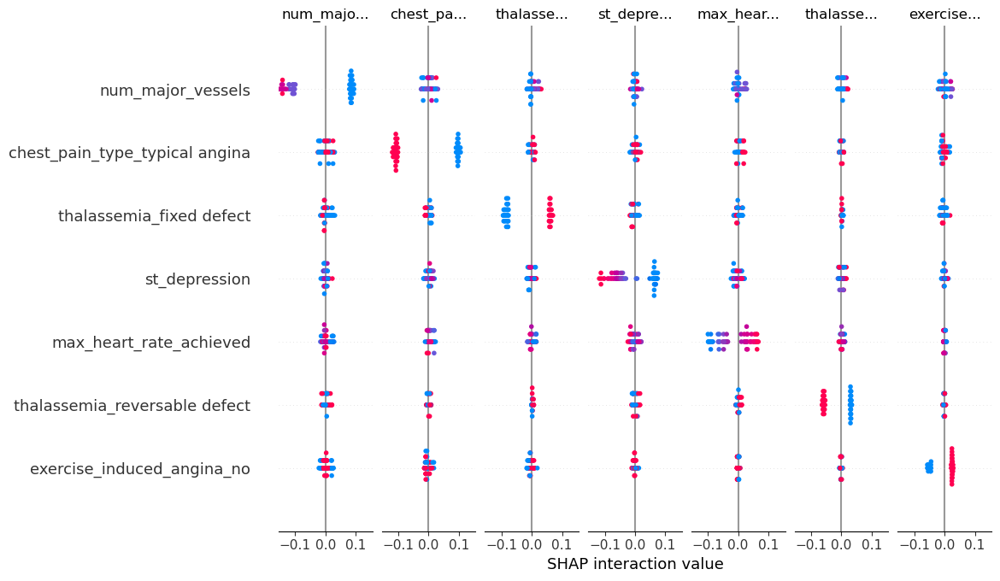

In [57]:
shap.summary_plot(shap_interaction_values[1],X_test)

In [58]:
shap_interaction_values[1][5].shape

(26, 26)

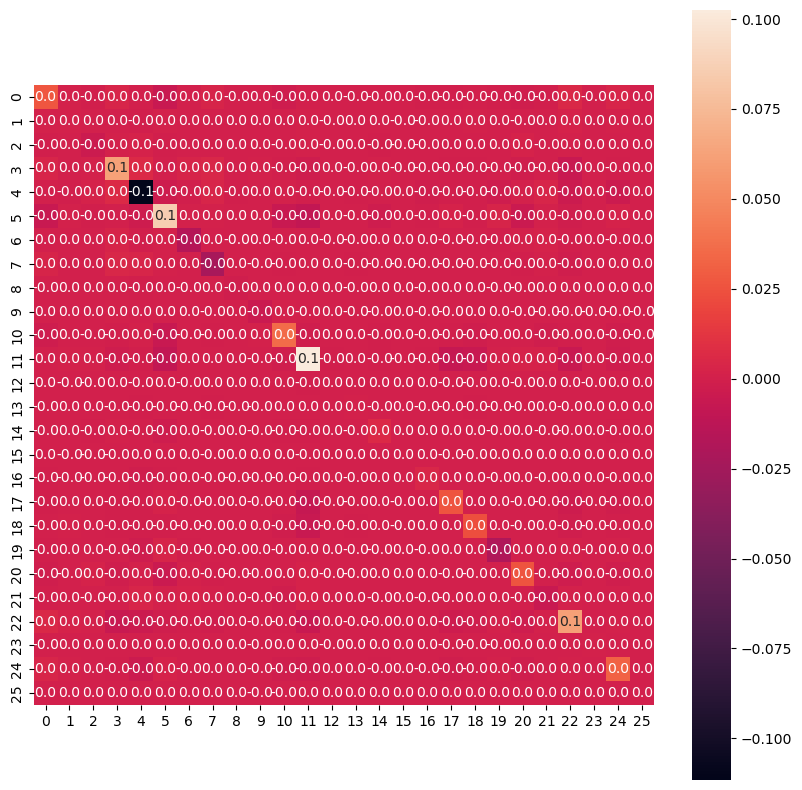

In [59]:
import seaborn as sns
plt.figure(figsize=(10,10))
sns.heatmap(shap_interaction_values[1][5],annot=True,fmt='.1f',square=True)
plt.show()

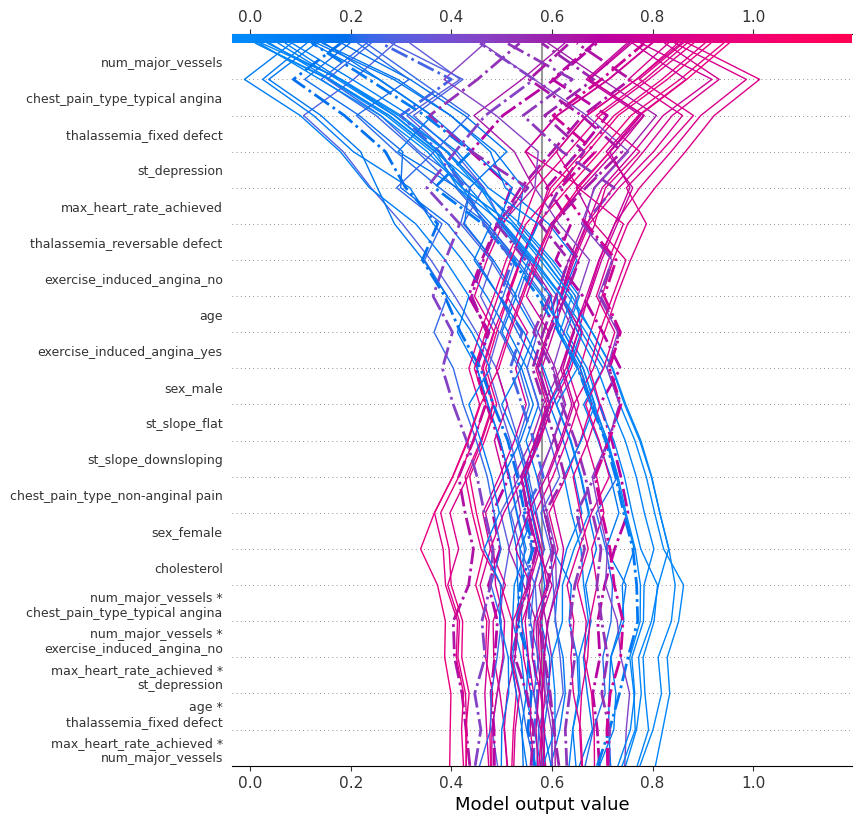

In [60]:
shap.decision_plot(expected_value[1], shap_interaction_values[1], X_test, highlight=misclassified)

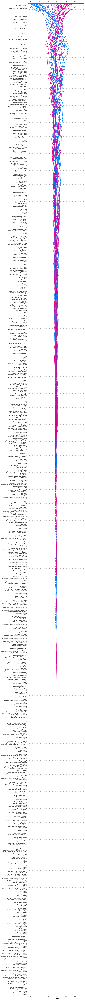

In [61]:
shap.decision_plot(expected_value[1], shap_interaction_values[1], X_test, highlight=misclassified, feature_display_range=slice(None, None, -1), ignore_warnings=True)

# 两两交互特征中的单个样本决策图

索引号为 27 的样本，在原始数据集X中的索引号为 186 


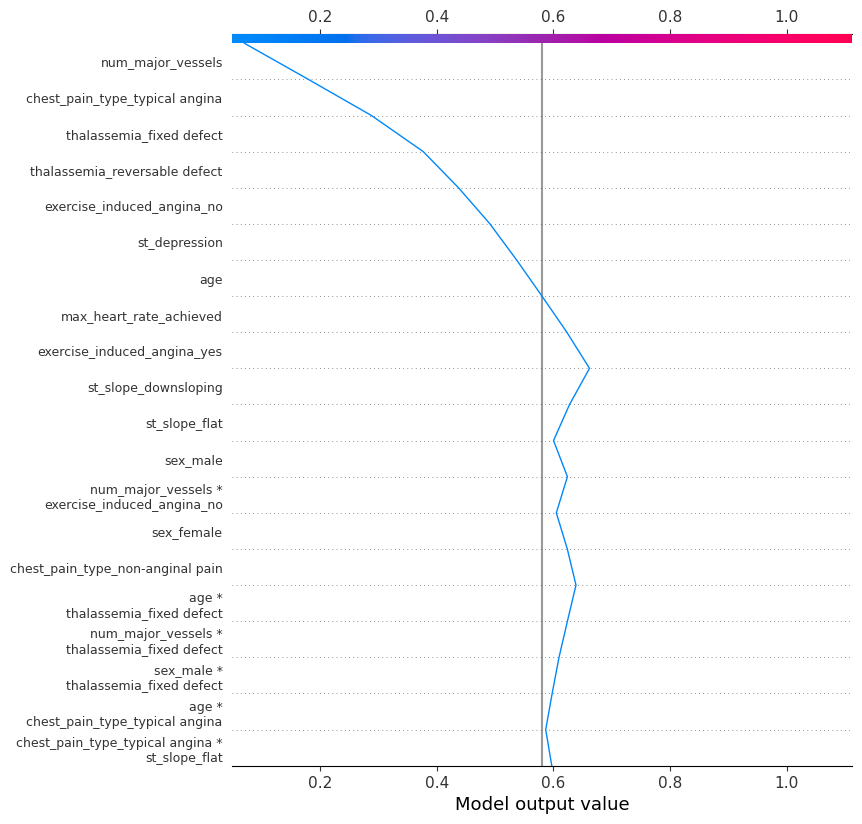

In [62]:
idx = 27
selection = np.zeros((61))
selection[idx] = 1
selection = selection > 0

print('索引号为 {} 的样本，在原始数据集X中的索引号为 {} '.format(idx,X_test.iloc[idx:idx+1].index[0]))

shap.decision_plot(expected_value[1], shap_interaction_values[1][selection], X_test[selection])

索引号为 27 的样本，在原始数据集X中的索引号为 186 


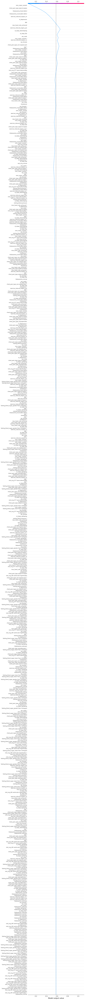

In [63]:
idx = 27
selection = np.zeros((61))
selection[idx] = 1
selection = selection > 0

print('索引号为 {} 的样本，在原始数据集X中的索引号为 {} '.format(idx,X_test.iloc[idx:idx+1].index[0]))

shap.decision_plot(expected_value[1], shap_interaction_values[1][selection], X_test[selection], feature_display_range=slice(None, None, -1), ignore_warnings=True)

# 以25号病人为例：

In [64]:
X_test

,age,resting_blood_pressure,cholesterol,max_heart_rate_achieved,st_depression,num_major_vessels,sex_female,sex_male,chest_pain_type_asymptomatic,chest_pain_type_atypical angina,...,rest_ecg_normal,exercise_induced_angina_no,exercise_induced_angina_yes,st_slope_downsloping,st_slope_flat,st_slope_upsloping,thalassemia_fixed defect,thalassemia_normal,thalassemia_reversable defect,thalassemia_unknown
246,56,134,409,150,1.9,2,1,0,0,0,...,1,0,1,0,1,0,0,0,1,0
183,58,112,230,165,2.5,1,0,1,0,0,...,1,1,0,0,1,0,0,0,1,0
229,64,125,309,131,1.8,0,0,1,0,0,...,0,0,1,0,1,0,0,0,1,0
126,47,112,204,143,0.1,0,0,1,0,0,...,0,1,0,1,0,0,1,0,0,0
184,50,150,243,128,2.6,0,0,1,0,0,...,1,1,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277,57,124,261,141,0.3,0,0,1,0,1,...,0,1,0,1,0,0,0,0,1,0
121,59,138,271,182,0.0,0,0,1,0,0,...,1,1,0,1,0,0,1,0,0,0
187,54,124,266,109,2.2,1,0,1,0,0,...,1,0,1,0,1,0,0,0,1,0
301,57,130,131,115,1.2,1,0,1,0,0,...,0,0,1,0,1,0,0,0,1,0


In [65]:
idx = 25
X_test.loc[idx]

age                                           71.0
resting_blood_pressure                       160.0
cholesterol                                  302.0
max_heart_rate_achieved                      162.0
st_depression                                  0.4
num_major_vessels                              2.0
sex_female                                     1.0
sex_male                                       0.0
chest_pain_type_asymptomatic                   0.0
chest_pain_type_atypical angina                1.0
chest_pain_type_non-anginal pain               0.0
chest_pain_type_typical angina                 0.0
fasting_blood_sugar_greater than 120mg/ml      0.0
fasting_blood_sugar_lower than 120mg/ml        1.0
rest_ecg_ST-T wave abnormality                 1.0
rest_ecg_left ventricular hypertrophy          0.0
rest_ecg_normal                                0.0
exercise_induced_angina_no                     1.0
exercise_induced_angina_yes                    0.0
st_slope_downsloping           

In [66]:
print('索引号为 {} 的样本，在原始数据集X中的索引号为 {} '.format(idx,X_test.iloc[idx:idx+1].index[0]))

索引号为 25 的样本，在原始数据集X中的索引号为 240 


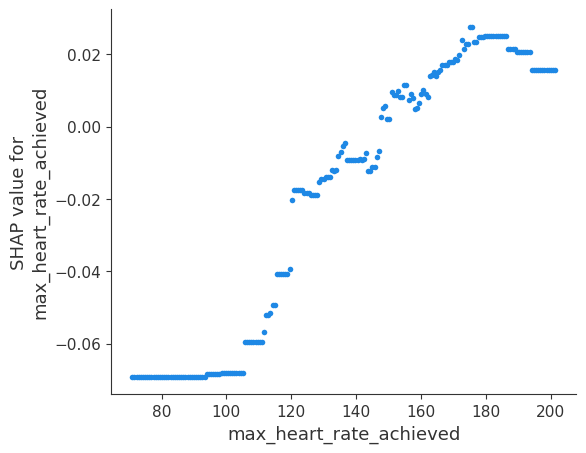

In [67]:
feature_selected = 'max_heart_rate_achieved'
sep = 200
feature_selected_min = X[feature_selected].min()
feature_selected_max = X[feature_selected].max()
step = (feature_selected_max - feature_selected_min)/sep
rg = np.arange(feature_selected_min, feature_selected_max, step)
R = X.iloc[np.repeat(idx, len(rg))].reset_index(drop=True)
R[feature_selected] = rg
hypothetical_shap_values = explainer.shap_values(R)[1]
shap.dependence_plot(feature_selected, hypothetical_shap_values, R, interaction_index=None)

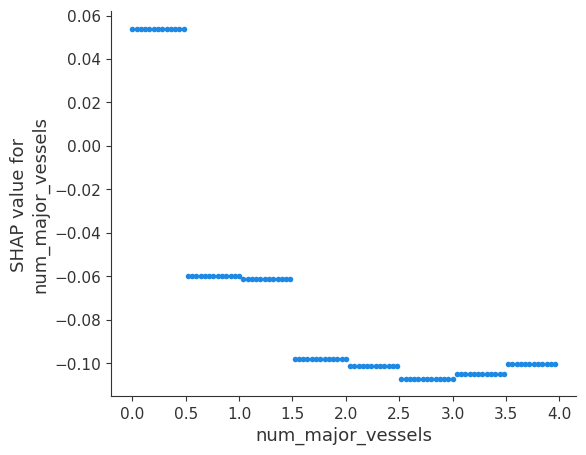

In [68]:
feature_selected = 'num_major_vessels'
sep = 100
feature_selected_min = X[feature_selected].min()
feature_selected_max = X[feature_selected].max()
step = (feature_selected_max - feature_selected_min)/sep
rg = np.arange(feature_selected_min, feature_selected_max, step)
R = X.iloc[np.repeat(idx, len(rg))].reset_index(drop=True)
R[feature_selected] = rg
hypothetical_shap_values = explainer.shap_values(R)[1]
shap.dependence_plot(feature_selected, hypothetical_shap_values, R, interaction_index=None)

* **25号病人某特征不同变化范围的决策图**

In [69]:
hypothetical_shap_values.shape

(100, 26)

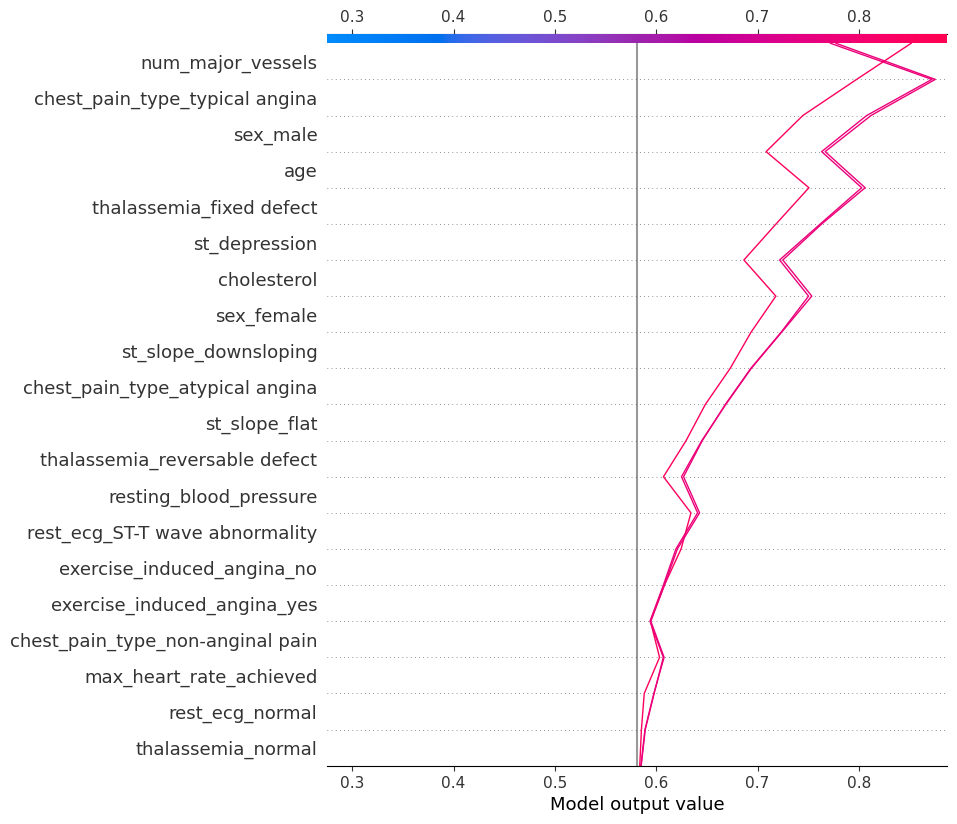

In [70]:
idx = 25
shap.decision_plot(expected_value[1], hypothetical_shap_values[[0,50,99]], X_test.iloc[idx], feature_order='importance')

# 找出受st_depression特征影响最大的病人

In [71]:
X_test['st_depression'].unique()

array([1.9, 2.5, 1.8, 0.1, 2.6, 3.5, 0. , 3. , 2. , 1. , 3.4, 1.4, 0.2,
       1.6, 0.8, 2.9, 2.2, 3.6, 1.5, 2.8, 0.4, 3.1, 0.6, 3.8, 3.2, 2.1,
       1.2, 0.3])

In [72]:
idx = np.argpartition(shap_values[1][:, X_test.columns.get_loc('st_depression')], 2)

In [73]:
idx.shape

(61,)

In [74]:
idx

array([ 5, 32, 46,  3,  4,  0,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31,  1, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45,  2, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60])

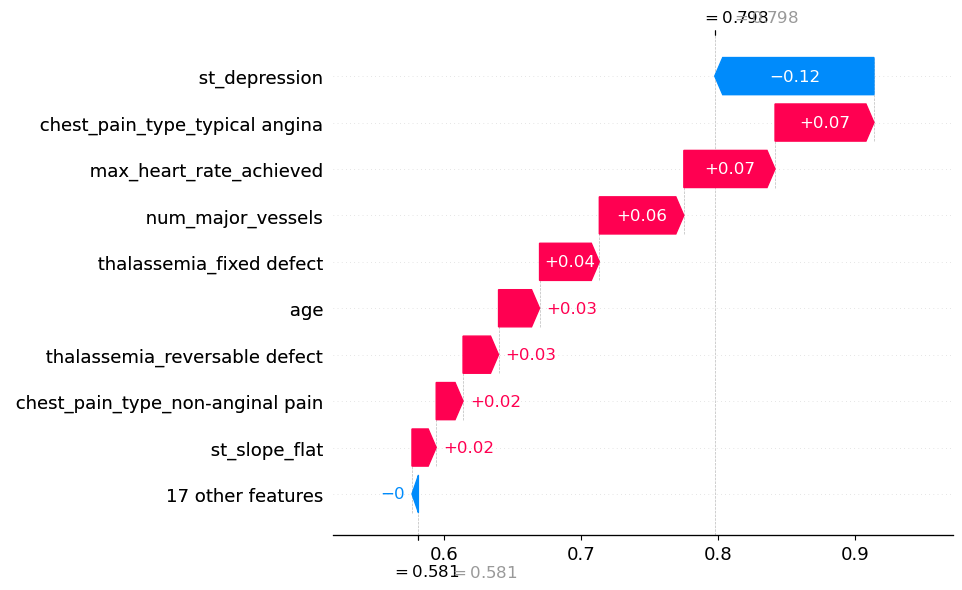

In [75]:
from shap.plots import _waterfall
idx = 5
patient = X_test.iloc[idx,:]
shap_values_patient = explainer.shap_values(patient)
_waterfall.waterfall_legacy(explainer.expected_value[1], shap_values_patient[1], patient)

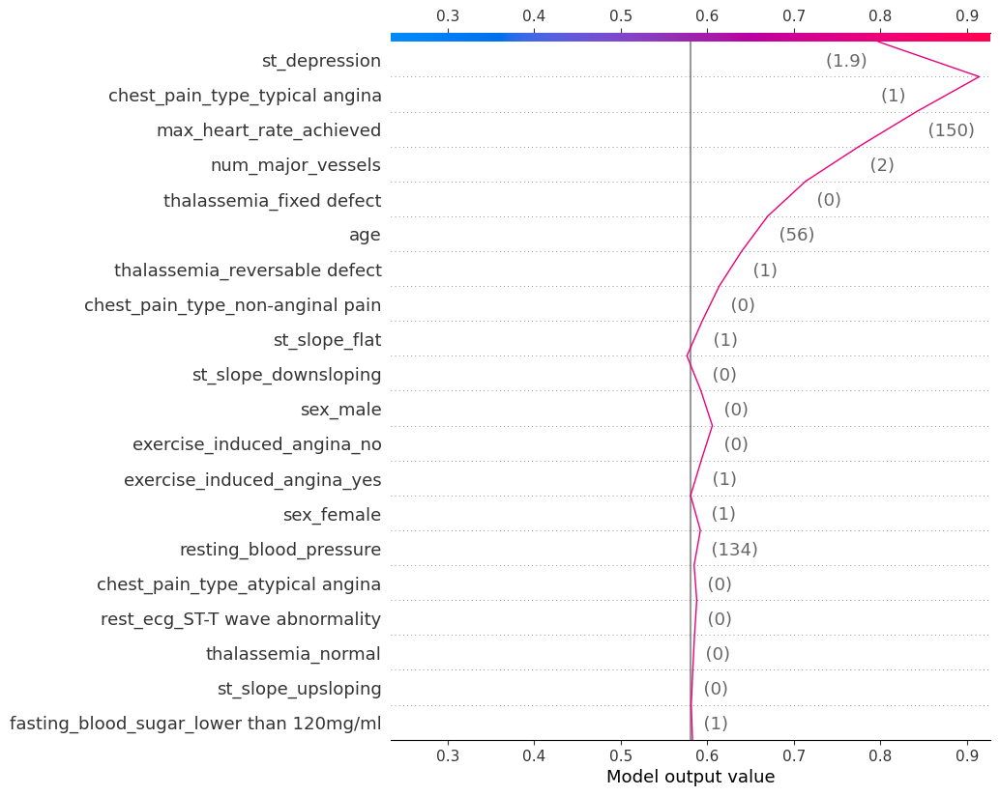

In [76]:
shap.decision_plot(expected_value[1], shap_values[1][5], X_test, feature_order='importance')

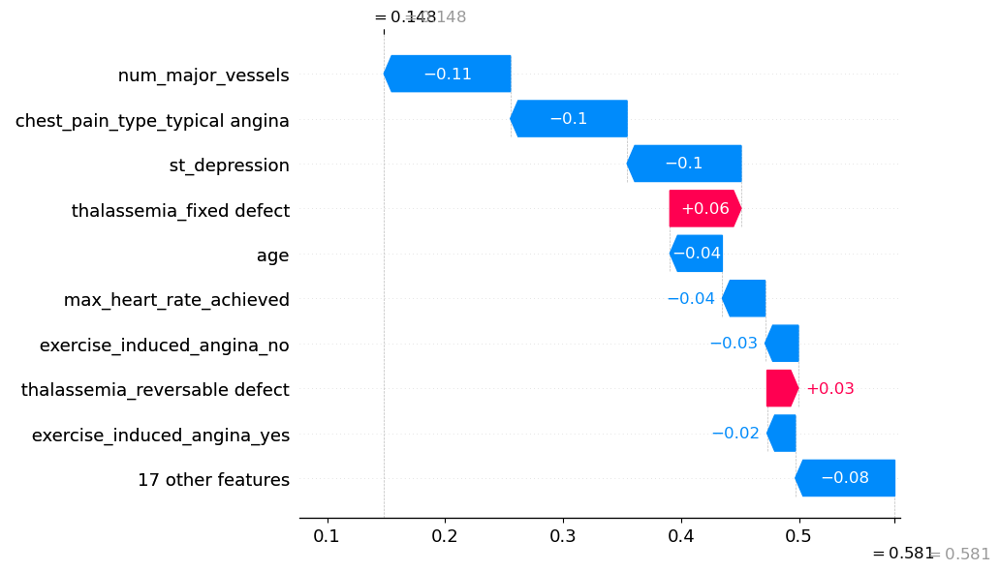

In [78]:
idx = 32
patient = X_test.iloc[idx,:]
shap_values_patient = explainer.shap_values(patient)
_waterfall.waterfall_legacy(explainer.expected_value[1], shap_values_patient[1], patient)

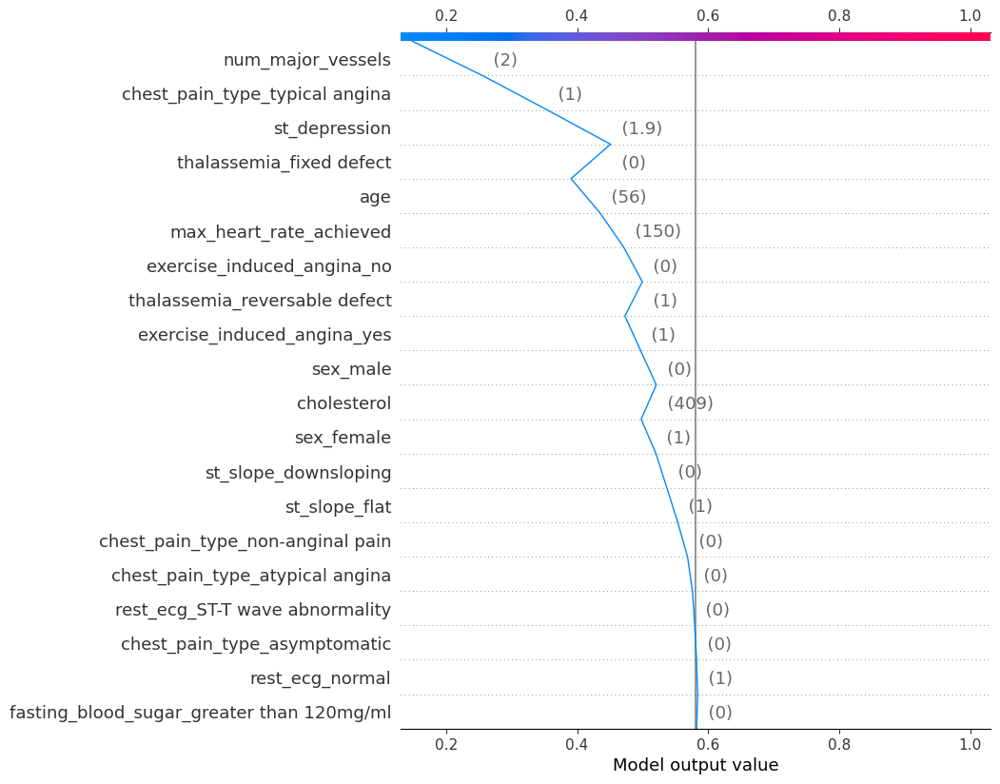

In [79]:
shap.decision_plot(expected_value[1], shap_values[1][32], X_test, feature_order='importance')

# 找出受max_heart_rate_achieved特征影响最大的病人

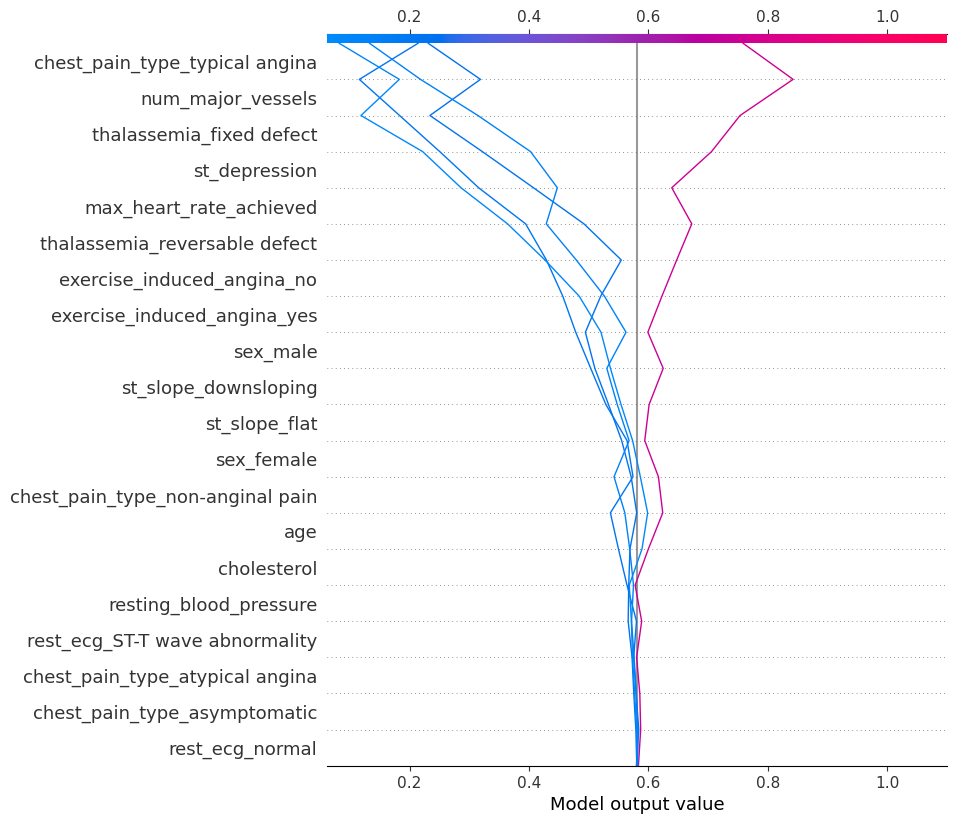

In [80]:
feature = 'max_heart_rate_achieved'
num_show = 5
idx = np.argpartition(shap_values[1][:, X_test.columns.get_loc(feature)], 2)
shap.decision_plot(expected_value[1], shap_values[1][idx[0:num_show]], X_test, feature_order='importance')

# 找出受num_major_vessels特征影响最大的病人

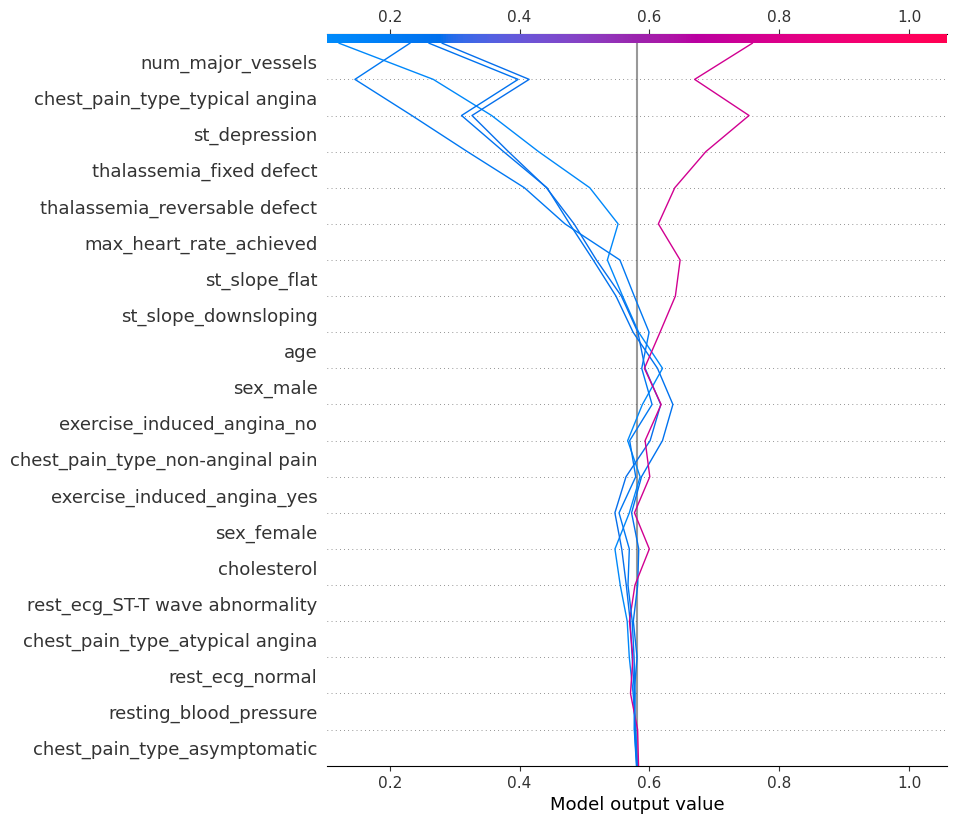

In [81]:
feature = 'num_major_vessels'
num_show = 5
idx = np.argpartition(shap_values[1][:, X_test.columns.get_loc(feature)], 2)
shap.decision_plot(expected_value[1], shap_values[1][idx[0:num_show]], X_test, feature_order='importance')